### In this notebook i will do some analysis and simple regression model based on our data which is uber and lyft fare dataset. I got this data from kaggle where the main purpose and objective of this large dataset is to model how price or cab fare varies with all the features that've been given.

# 1. Importing Library and Dataset

In [1]:
#pip install -U kaleido

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
pd.options.display.max_rows = None
pd.options.display.max_columns = None

In [3]:
%pip install -U kaleido
import kaleido

Note: you may need to restart the kernel to use updated packages.


In [4]:
df=pd.read_csv("rideshare_kaggle.csv")
df.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,product_id,name,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,short_summary,long_summary,precipIntensity,precipProbability,humidity,windSpeed,windGust,windGustTime,visibility,temperatureHigh,temperatureHighTime,temperatureLow,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,icon,dewPoint,pressure,windBearing,cloudCover,uvIndex,visibility.1,ozone,sunriseTime,sunsetTime,moonPhase,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,lyft_line,Shared,5.0,0.44,1.0,42.2148,-71.033,42.34,37.12,Mostly Cloudy,Rain throughout the day.,0.0000,0.0,0.68,8.66,9.17,1545015600,10.000,43.68,1544968800,34.19,1545048000,37.95,1544968800,27.39,1545044400,partly-cloudy-night,32.70,1021.98,57,0.72,0,10.000,303.8,1544962084,1544994864,0.30,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,lyft_premier,Lux,11.0,0.44,1.0,42.2148,-71.033,43.58,37.35,Rain,"Rain until morning, starting again in the eve...",0.1299,1.0,0.94,11.98,11.98,1543291200,4.786,47.30,1543251600,42.10,1543298400,43.92,1543251600,36.20,1543291200,rain,41.83,1003.97,90,1.00,0,4.786,291.1,1543232969,1543266992,0.64,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,lyft,Lyft,7.0,0.44,1.0,42.2148,-71.033,38.33,32.93,Clear,Light rain in the morning.,0.0000,0.0,0.75,7.33,7.33,1543334400,10.000,47.55,1543320000,33.10,1543402800,44.12,1543320000,29.11,1543392000,clear-night,31.10,992.28,240,0.03,0,10.000,315.7,1543319437,1543353364,0.68,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,lyft_luxsuv,Lux Black XL,26.0,0.44,1.0,42.2148,-71.033,34.38,29.63,Clear,Partly cloudy throughout the day.,0.0000,0.0,0.73,5.28,5.28,1543514400,10.000,45.03,1543510800,28.90,1543579200,38.53,1543510800,26.20,1543575600,clear-night,26.64,1013.73,310,0.00,0,10.000,291.1,1543492370,1543526114,0.75,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,lyft_plus,Lyft XL,9.0,0.44,1.0,42.2148,-71.033,37.44,30.88,Partly Cloudy,Mostly cloudy throughout the day.,0.0000,0.0,0.70,9.14,9.14,1543446000,10.000,42.18,1543420800,36.71,1543478400,35.75,1543420800,30.29,1543460400,partly-cloudy-night,28.61,998.36,303,0.44,0,10.000,347.7,1543405904,1543439738,0.72,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693071 entries, 0 to 693070
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           693071 non-null  object 
 1   timestamp                    693071 non-null  float64
 2   hour                         693071 non-null  int64  
 3   day                          693071 non-null  int64  
 4   month                        693071 non-null  int64  
 5   datetime                     693071 non-null  object 
 6   timezone                     693071 non-null  object 
 7   source                       693071 non-null  object 
 8   destination                  693071 non-null  object 
 9   cab_type                     693071 non-null  object 
 10  product_id                   693071 non-null  object 
 11  name                         693071 non-null  object 
 12  price                        637976 non-null  float64
 13 

In [6]:
df['datetime']=pd.to_datetime(df['datetime'])

### Data Cleaning

In [7]:
df.shape

(693071, 57)

In [8]:
df.isnull().sum().sum()

55095

In [9]:
df.dropna(axis=0,inplace=True)

In [10]:
df.isnull().sum().sum()

0

In [11]:
df['visibility'].head()

0    10.000
1     4.786
2    10.000
3    10.000
4    10.000
Name: visibility, dtype: float64

In [12]:
df['visibility.1'].head()

0    10.000
1     4.786
2    10.000
3    10.000
4    10.000
Name: visibility.1, dtype: float64

In [13]:
df = df.drop(['visibility.1'],axis=1)

In [14]:
for col in df.columns : 
  print(df[col].value_counts(dropna=False))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1.545000e+09    421
1.543422e+09    150
1.543416e+09    149
1.543402e+09    149
1.543424e+09    148
1.543439e+09    148
1.543404e+09    148
1.543404e+09    148
1.543403e+09    148
1.543419e+09    147
1.543406e+09    147
1.543405e+09    146
1.543401e+09    146
1.543425e+09    146
1.543407e+09    146
1.543410e+09    146
1.543409e+09    145
1.543403e+09    145
1.543440e+09    145
1.543422e+09    145
1.543427e+09    145
1.543416e+09    145
1.543414e+09    145
1.543463e+09    145
1.543442e+09    145
1.543442e+09    145
1.543454e+09    145
1.543442e+09    145
1.543409e+09    145
1.543440e+09    144
1.543406e+09    144
1.543463e+09    144
1.543445e+09    144
1.543441e+09    144
1.543428e+09    144
1.543439e+09    144
1.543446e+09    144
1.543443e+09    144
1.543430e+09    144
1.543454e+09    144
1.543433e+09    144
1.543442e+09    144
1.543423e+09    144
1.543410e+09    144
1.543418e+09    143
1.543400e+09    143
1.543402e+09    143
1.543420e+09    143
1.543415e+09    143
1.543448e+09    143


America/New_York    637976
Name: timezone, dtype: int64
Financial District         54197
Back Bay                   53201
Theatre District           53201
Boston University          53172
North End                  53171
Fenway                     53166
Northeastern University    53164
South Station              53160
Haymarket Square           53147
West End                   52980
Beacon Hill                52841
North Station              52576
Name: source, dtype: int64
Financial District         54192
Back Bay                   53190
Theatre District           53189
Haymarket Square           53171
Boston University          53171
Fenway                     53166
Northeastern University    53165
North End                  53164
South Station              53159
West End                   52992
Beacon Hill                52840
North Station              52577
Name: destination, dtype: int64
Uber    330568
Lyft    307408
Name: cab_type, dtype: int64
6f72dfc5-27f1-42e8-84db-ccc7a75f69

33.81    5182
32.45    5032
33.00    4881
35.66    4869
37.54    4624
34.59    4611
35.14    4608
29.99    4607
32.06    4606
31.03    4604
30.98    4596
35.13    4590
35.90    4588
34.01    4586
35.84    4574
31.91    4315
30.88    4258
32.09    4017
39.94    3743
27.83    3480
47.56    3473
35.52    3470
29.63    3456
15.44    3448
35.00    3443
35.62    3442
31.98    3436
31.10    3432
37.73    3430
30.15    3291
41.40    3271
37.38    3150
36.71    3002
37.56    2899
34.07    2894
42.13    2891
35.18    2890
34.55    2886
44.19    2885
37.35    2878
36.79    2878
36.10    2878
37.06    2877
35.55    2877
40.15    2876
37.33    2875
34.08    2870
34.42    2870
36.87    2870
37.66    2864
39.93    2863
37.84    2862
41.77    2862
38.92    2855
43.49    2851
37.78    2848
41.07    2381
36.09    2177
32.35    2156
34.35    2008
30.09    1858
37.51    1751
39.27    1747
29.50    1747
39.41    1745
20.78    1745
46.04    1744
48.11    1743
39.66    1743
44.67    1742
39.99    1741
30.46 

32.12    18829
31.97    13767
30.29    13743
36.70    13492
31.82    12047
28.06    12021
30.03    11473
27.22    10371
35.69    10367
35.08    10333
35.32    10301
29.11     9357
36.20     9351
29.97     8649
35.55     8638
29.07     8638
24.61     8632
29.88     8632
47.25     8608
28.10     8605
38.56     8593
32.25     8337
31.91     7948
31.87     7606
36.47     7505
28.21     6917
11.83     6908
25.87     6906
26.20     6906
24.47     6897
35.23     6892
24.55     6891
45.69     6887
38.78     6881
34.85     6880
45.62     6879
11.82     6875
30.19     5738
30.08     5734
27.89     5478
28.12     5199
38.58     5188
12.04     5186
27.88     5186
38.71     5175
35.18     5173
28.61     5167
14.31     5160
28.30     5158
28.00     5156
45.53     5155
28.43     5155
28.23     5153
14.48     5149
28.11     5148
12.12     5148
27.70     5148
45.61     5140
27.20     5133
28.72     5029
32.23     4606
37.08     4550
26.32     3900
26.41     3874
14.29     3472
14.27     3472
35.53     

1543399200    73286
1543377600    58242
1543233600    44071
1544929200    41319
1543726800    41298
1544688000    41236
1543896000    41201
1543550400    41051
1544954400    37893
1545044400    36181
1543579200    32888
1543658400    25861
1545192000    24717
1544788800    20701
1544781600    20677
1543402800    13743
1543662000    10357
1543575600     8923
1545048000     5186
1543665600     5171
1544353200     4063
1545012000     3428
1543982400     3140
1544673600     2876
1543122000      467
Name: temperatureMinTime, dtype: int64
42.60    25814
42.61    25166
44.66    13790
42.18    13743
42.57    13572
46.49    13492
54.29    12053
54.47    12052
47.11    11473
57.87    10371
41.44    10328
47.55     9357
47.30     9351
42.70     9033
46.83     8649
44.72     8638
33.83     8632
45.03     8630
52.86     8608
42.72     8337
46.59     7505
44.76     7330
43.78     6917
44.96     6914
41.42     6908
42.13     6906
33.92     6897
44.11     6892
33.96     6891
57.27     6889
50.99     6

# 2. EDA and Visualization

## 1. Time Analysis 

### --Month Data--

In [15]:
def plot_bar(groupby_column):
    df1 =df.groupby(groupby_column).size().reset_index(name="counts")
    fig1 = px.bar(data_frame=df1, x=groupby_column, y="counts", color=groupby_column, barmode="group")
    print(df1)
    fig1.show(renderer='png')

   month  counts
0     11  263771
1     12  374205


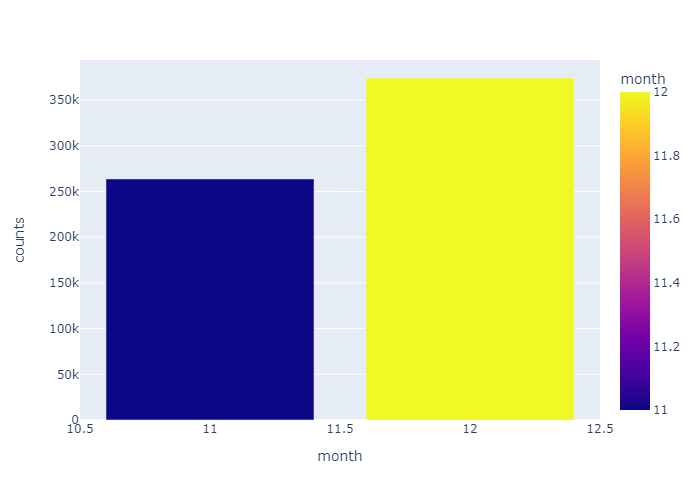

In [16]:
plot_bar('month')

### It appears that we only have november and december in our month data. It means the data is only recorded or taken in november and december with december data dominating.

### --Day Data--

    day  counts
0     1   41680
1     2   41298
2     3   41323
3     4   11627
4     9    1529
5    10    2534
6    13   35496
7    14   41344
8    15   41332
9    16   41359
10   17   41354
11   18   33329
12   26   29028
13   27   70135
14   28   67842
15   29   55222
16   30   41544


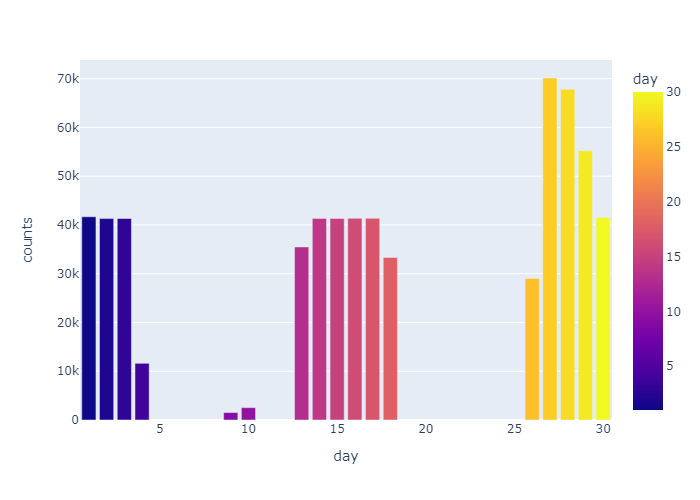

In [17]:
plot_bar('day')

### It seems we have many gaps in our 'day' data. For example we don't have data from 18th day until 25th day in each month.

### --Hour Data--

    hour  counts
0      0   29872
1      1   26310
2      2   26323
3      3   25530
4      4   26125
5      5   22995
6      6   25147
7      7   22930
8      8   22337
9      9   26673
10    10   27918
11    11   27946
12    12   28017
13    13   27977
14    14   27976
15    15   27868
16    16   27972
17    17   28075
18    18   27958
19    19   25410
20    20   24620
21    21   25549
22    22   27093
23    23   29355


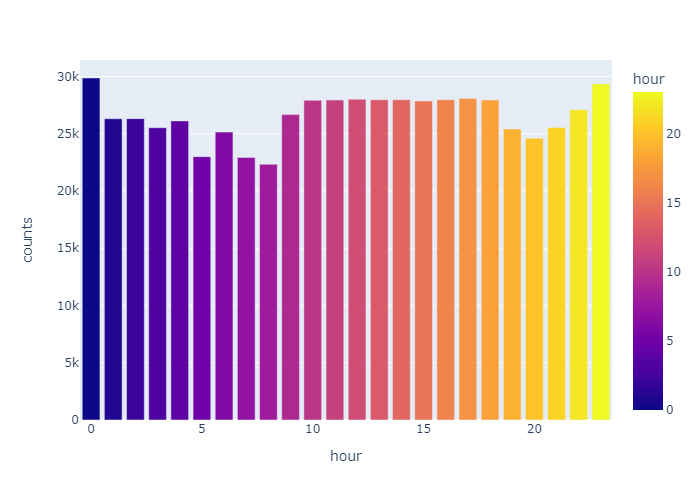

In [18]:
plot_bar('hour')

### It seems we have almost 24 hours recorded data

## 2. Source and Destination Analysis

                     source  counts
0                  Back Bay   53201
1               Beacon Hill   52841
2         Boston University   53172
3                    Fenway   53166
4        Financial District   54197
5          Haymarket Square   53147
6                 North End   53171
7             North Station   52576
8   Northeastern University   53164
9             South Station   53160
10         Theatre District   53201
11                 West End   52980


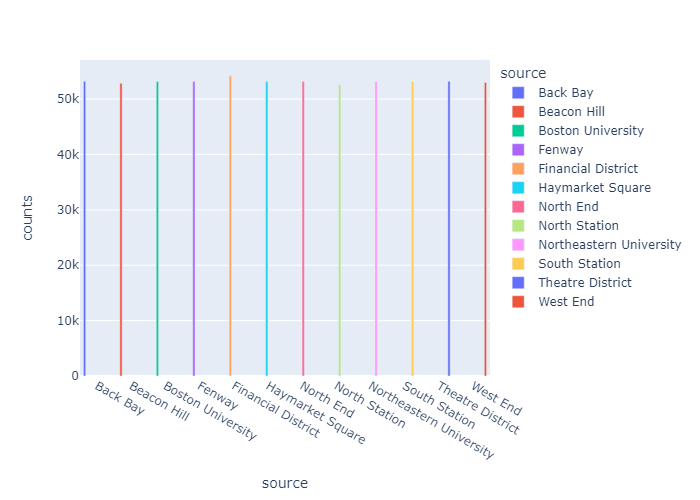

In [19]:
plot_bar('source')

### It seems that all sources are almost equal in number. There are about 50k data in each source feature (Back Bay, Beacon Hill, Boston University, etc)

                destination  counts
0                  Back Bay   53190
1               Beacon Hill   52840
2         Boston University   53171
3                    Fenway   53166
4        Financial District   54192
5          Haymarket Square   53171
6                 North End   53164
7             North Station   52577
8   Northeastern University   53165
9             South Station   53159
10         Theatre District   53189
11                 West End   52992


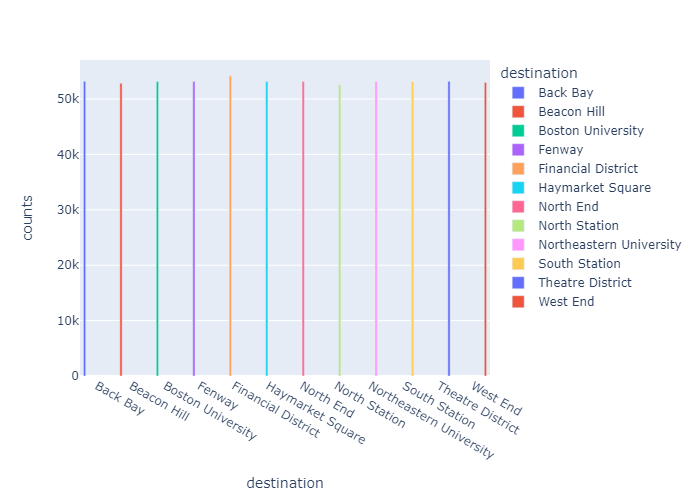

In [20]:
plot_bar('destination')

### Same with source feature, there are about 50k data in each destination feature (Back Bay, Beacon Hill, Boston University, etc)

In [21]:
df['destination'].value_counts(normalize=True,dropna=False)

Financial District         0.084944
Back Bay                   0.083373
Theatre District           0.083371
Haymarket Square           0.083343
Boston University          0.083343
Fenway                     0.083335
Northeastern University    0.083334
North End                  0.083332
South Station              0.083324
West End                   0.083063
Beacon Hill                0.082824
North Station              0.082412
Name: destination, dtype: float64

<Axes: xlabel='source', ylabel='destination'>

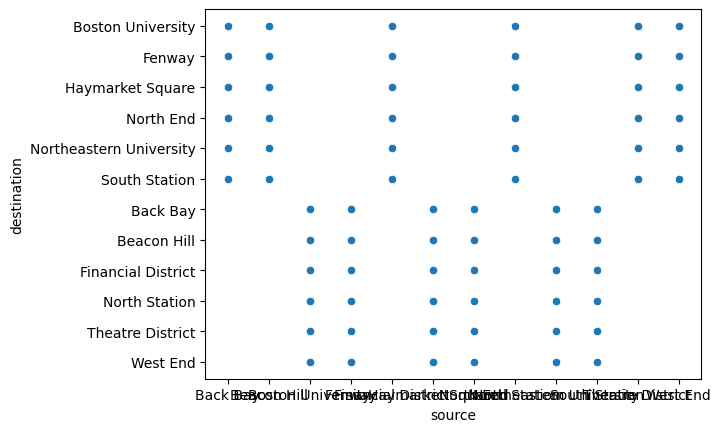

In [22]:
temp1 = df.groupby(by=["source","destination"],as_index=False).count()
sns.scatterplot(data=temp1,x='source',y='destination')

In [23]:
df.groupby(by=["destination","source"]).agg({'latitude':'mean','longitude':'mean'})

latitude  longitude
destination             source                                       
Back Bay                Boston University        42.336960 -71.066178
                        Fenway                   42.337740 -71.065822
                        Haymarket Square         42.337087 -71.065110
                        North End                42.338100 -71.066343
                        Northeastern University  42.336668 -71.065314
                        South Station            42.338897 -71.065908
Beacon Hill             Boston University        42.336917 -71.065885
                        Fenway                   42.338990 -71.065719
                        Haymarket Square         42.337413 -71.066059
                        North End                42.338418 -71.065809
                        Northeastern University  42.337268 -71.066061
                        South Station            42.336316 -71.065699
Boston University       Back Bay                 42.337217 -71.065947
                        Beacon Hill              42.339364 -71.066517
                        Financial District       42.339361 -71.066465
                        North Station            42.338372 -71.066191
                        Theatre District         42.338152 -71.066276
                        West End                 42.337556 -71.066265
Fenway                  Back Bay                 42.340103 -71.065819
                        Beacon Hill              42.337595 -71.065471
                        Financial District       42.337147 -71.066254
                        North Station            42.339660 -71.066504
                        Theatre District         42.336378 -71.065388
                        West End                 42.338521 -71.066339
Financial District      Boston University        42.338733 -71.066581
                        Fenway                   42.337034 -71.066028
                        Haymarket Square         42.337781 -71.065863
                        North End                42.338338 -71.065965
                        Northeastern University  42.338523 -71.065964
                        South Station            42.338989 -71.067037
Haymarket Square        Back Bay                 42.339877 -71.066475
                        Beacon Hill              42.337246 -71.065966
                        Financial District       42.337398 -71.066237
                        North Station            42.338276 -71.066073
                        Theatre District         42.338175 -71.065699
                        West End                 42.339109 -71.066251
North End               Back Bay                 42.338516 -71.066170
                        Beacon Hill              42.336792 -71.066216
                        Financial District       42.337654 -71.066158
                        North Station            42.339309 -71.066936
                        Theatre District         42.338578 -71.066639
                        West End                 42.338614 -71.065878
North Station           Boston University        42.338786 -71.066362
                        Fenway                   42.338450 -71.066614
                        Haymarket Square         42.337260 -71.066279
                        North End                42.337672 -71.065832
                        Northeastern University  42.337793 -71.066491
                        South Station            42.336529 -71.065432
Northeastern University Back Bay                 42.338917 -71.066289
                        Beacon Hill              42.339002 -71.065600
                        Financial District       42.337789 -71.066015
                        North Station            42.339770 -71.066493
                        Theatre District         42.338356 -71.065319
                        West End                 42.336812 -71.066274
South Station           Back Bay                 42.338567 -71.065891
                        Beacon Hill              42.338714 -

### Here we make a geospatial map to visualize our data which the departure point of the trips is haymarket square. We plot them using clusters instead of marker. The map rendered by folium is interactive, we can slide, drag, and zoom in/out.

In [24]:
%pip install geopandas

Note: you may need to restart the kernel to use updated packages.


In [25]:
!pip install folium

In [26]:
import geopandas as gpd
import folium
from folium.plugins import FastMarkerCluster
df1 = df[df['source']=='Haymarket Square']
my_map = folium.Map(location=[df1["latitude"].mean(), df1["longitude"].mean()],zoom_start = 10)
my_map.add_child(FastMarkerCluster(df1[['latitude', 'longitude']].values.tolist(),color='green'))
my_map

In [27]:
#df1 = df[df['source']=='Haymarket Square']
df2 = df.copy()
my_map = folium.Map(location=[df2["latitude"].mean(), df2["longitude"].mean()],zoom_start = 10)
my_map.add_child(FastMarkerCluster(df2[['latitude', 'longitude']].values.tolist(),color='green'))
my_map

### We can see that trips which their sources are Haymarket Square have two groups or clusters of destination that contain many places (we can see them if we zoom the map). Many of them are in boston area as we can see that there are 46256 data in that cluster.

## 3. Cab Type Analysis

  cab_type  counts
0     Lyft  307408
1     Uber  330568


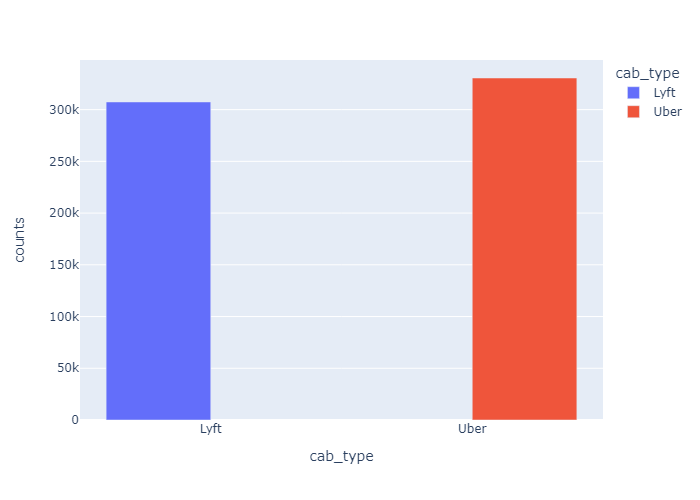

In [28]:
plot_bar('cab_type')

### So for our whole data, we have uber data more than lyft data. The difference is not too big, each cab type has about 300K data.

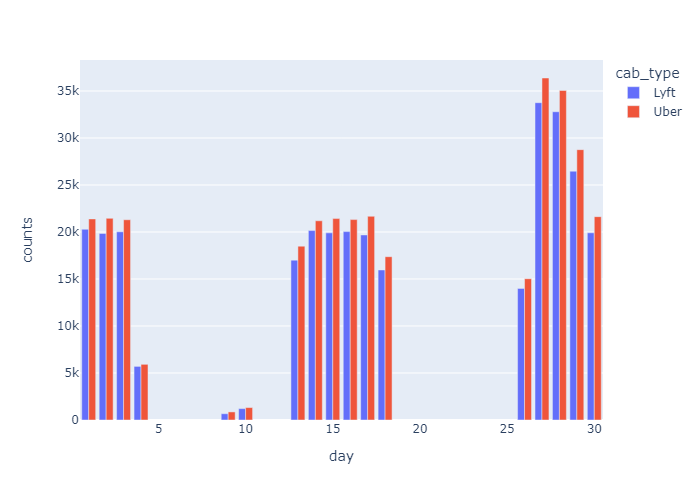

In [29]:
df2 =df.groupby(by=["day","cab_type"]).size().reset_index(name="counts")
fig2 = px.bar(data_frame=df2, x="day", y="counts", color="cab_type", barmode="group")
fig2.show(renderer='png')

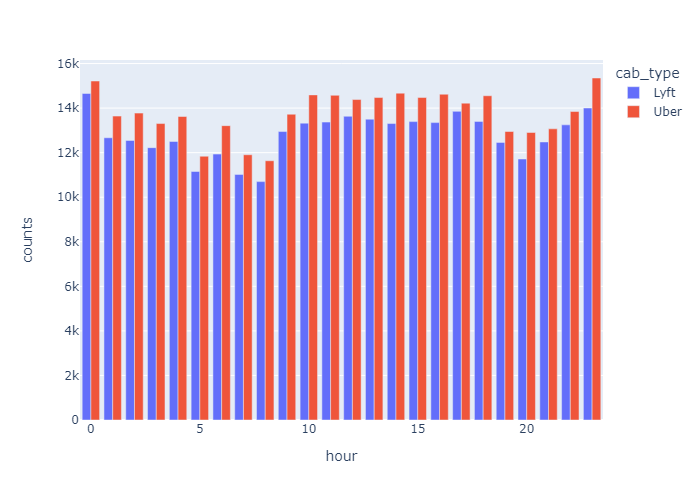

In [30]:
df3 =df.groupby(["hour","cab_type"]).size().reset_index(name="counts")
fig3 = px.bar(data_frame=df3, x="hour", y="counts", color="cab_type", barmode="group")
fig3.show(renderer='png')

### So in every day and every hour recorded, uber seems dominating booking order in our data

## 4. Price Analysis

### We can see average or mean of our price data in every route (source-destination) through table below

C:\Users\Atharva\AppData\Local\Temp\ipykernel_18124\2223566307.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



<Axes: xlabel='source', ylabel='price'>

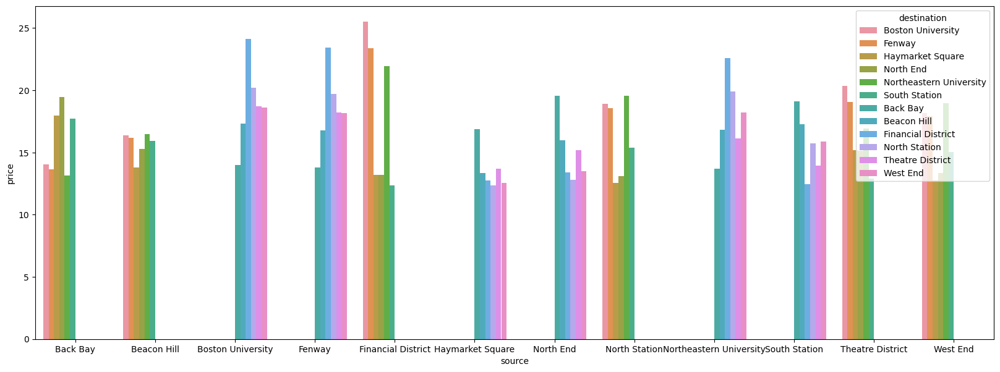

In [31]:
pd.set_option('display.max_rows', 72)
#df.groupby(by=["source","destination"],as_index=False).price.agg(["mean"])
temp2 = (
    df
    .groupby(by=["source","destination"],as_index=False)
    .mean()
)
temp2
fig, ax = plt.subplots(1,1,figsize=(20,7))
sns.barplot(data=temp2,x='source',y='price',hue='destination',ax=ax)

### And we can see our maximum price data

In [32]:
print('Maximum price in our data :',df.price.max())
df[df['price']==df.price.max()]

Maximum price in our data : 97.5


,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,product_id,name,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,short_summary,long_summary,precipIntensity,precipProbability,humidity,windSpeed,windGust,windGustTime,visibility,temperatureHigh,temperatureHighTime,temperatureLow,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,icon,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,sunriseTime,sunsetTime,moonPhase,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
597071,ba1593a1-e4fd-4c7a-a011-e2d4fccbf081,1.543714e+09,1,2,12,2018-12-02 01:28:02,America/New_York,Financial District,Fenway,Lyft,lyft_luxsuv,Lux Black XL,97.5,4.43,2.0,42.3503,-71.081,35.52,35.52,Clear,Light rain in the morning and overnight.,0.0,0.0,0.82,1.85,2.37,1543672800,9.846,44.65,1543690800,34.88,1543712400,43.98,1543690800,35.53,1543712400,clear-night,30.46,1023.52,146,0.12,0,274.6,1543665335,1543698860,0.82,0.0,1543683600,31.57,1543665600,44.65,1543690800,28.1,1543658400,43.98,1543690800


In [33]:
df[df['price']==df.price.max()][['latitude','longitude']]

,latitude,longitude
597071,42.3503,-71.081


### I can plot the map of both places using folium to see how far they are from each other (I only inserted the snapshot of the plot)

In [34]:
#Using this code:
map1 = folium.Map(location=(42.3503,-71.081),zoom_start = 10)
folium.Marker(location=(42.3503,-71.081)).add_to(map1) # Fenway
folium.Marker(location=(42.3378,-71.066)).add_to(map1) # Financial District
display(map1)

### Apparently the 'Financial District - Fenway' route (by lyft) costs 97.5 dollars, which is our maximum price data. But from the map above, the distance between both places is not too far (they are both in boston), so it could be outlier since we don't have information about trip duration or transit. We should check another data with the same route

In [35]:
df_group = df.groupby(by=["source","destination"]).price.agg(["mean"]).reset_index()
df_group[(df_group['source']=='Financial District')& (df_group['destination']=='Fenway')]

,source,destination,mean
25,Financial District,Fenway,23.40485


### The mean of the price data of that route is 23.4 dollars, which is far from our maximum price data (97.5 dollars). Then it is possible an outlier. We can drop it.

In [36]:
df = df.loc[df['price']!=df.price.max()]

In [37]:
df.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,product_id,name,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,short_summary,long_summary,precipIntensity,precipProbability,humidity,windSpeed,windGust,windGustTime,visibility,temperatureHigh,temperatureHighTime,temperatureLow,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,icon,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,sunriseTime,sunsetTime,moonPhase,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,lyft_line,Shared,5.0,0.44,1.0,42.2148,-71.033,42.34,37.12,Mostly Cloudy,Rain throughout the day.,0.0000,0.0,0.68,8.66,9.17,1545015600,10.000,43.68,1544968800,34.19,1545048000,37.95,1544968800,27.39,1545044400,partly-cloudy-night,32.70,1021.98,57,0.72,0,303.8,1544962084,1544994864,0.30,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,lyft_premier,Lux,11.0,0.44,1.0,42.2148,-71.033,43.58,37.35,Rain,"Rain until morning, starting again in the eve...",0.1299,1.0,0.94,11.98,11.98,1543291200,4.786,47.30,1543251600,42.10,1543298400,43.92,1543251600,36.20,1543291200,rain,41.83,1003.97,90,1.00,0,291.1,1543232969,1543266992,0.64,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,lyft,Lyft,7.0,0.44,1.0,42.2148,-71.033,38.33,32.93,Clear,Light rain in the morning.,0.0000,0.0,0.75,7.33,7.33,1543334400,10.000,47.55,1543320000,33.10,1543402800,44.12,1543320000,29.11,1543392000,clear-night,31.10,992.28,240,0.03,0,315.7,1543319437,1543353364,0.68,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,lyft_luxsuv,Lux Black XL,26.0,0.44,1.0,42.2148,-71.033,34.38,29.63,Clear,Partly cloudy throughout the day.,0.0000,0.0,0.73,5.28,5.28,1543514400,10.000,45.03,1543510800,28.90,1543579200,38.53,1543510800,26.20,1543575600,clear-night,26.64,1013.73,310,0.00,0,291.1,1543492370,1543526114,0.75,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,lyft_plus,Lyft XL,9.0,0.44,1.0,42.2148,-71.033,37.44,30.88,Partly Cloudy,Mostly cloudy throughout the day.,0.0000,0.0,0.70,9.14,9.14,1543446000,10.000,42.18,1543420800,36.71,1543478400,35.75,1543420800,30.29,1543460400,partly-cloudy-night,28.61,998.36,303,0.44,0,347.7,1543405904,1543439738,0.72,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


# 3. Data Preprocessing / Feature Engineering

## 1. Removing Unnecessary Features

In [38]:
# For further modelling i don't think we need date related features. But maybe we need them in the future analysis.
# so i will make new dataframe

new_df = df.drop(['id','long_summary','apparentTemperatureHighTime','apparentTemperatureLowTime',
                  'apparentTemperatureLowTime','windGustTime','sunriseTime','sunsetTime','uvIndexTime','temperatureMinTime',
                 'temperatureMaxTime','apparentTemperatureMinTime','temperatureLowTime','apparentTemperatureMaxTime'],axis=1)

In [39]:
new_df.shape

(637975, 43)

### Our goal is to make linear regression model. First we check correlation between our features and target feature (price)

### First, i want to check the correlation of our temperature related features with our target feature (Price)

In [40]:
temp_cols= ['temperature','apparentTemperature','temperatureHigh','temperatureLow','apparentTemperatureHigh',
                'apparentTemperatureLow','temperatureMin','temperatureHighTime','temperatureMax','apparentTemperatureMin','apparentTemperatureMax','price']

In [41]:
df_temp = new_df[temp_cols]
df_temp.head()

,temperature,apparentTemperature,temperatureHigh,temperatureLow,apparentTemperatureHigh,apparentTemperatureLow,temperatureMin,temperatureHighTime,temperatureMax,apparentTemperatureMin,apparentTemperatureMax,price
0,42.34,37.12,43.68,34.19,37.95,27.39,39.89,1544968800,43.68,33.73,38.07,5.0
1,43.58,37.35,47.30,42.10,43.92,36.20,40.49,1543251600,47.30,36.20,43.92,11.0
2,38.33,32.93,47.55,33.10,44.12,29.11,35.36,1543320000,47.55,31.04,44.12,7.0
3,34.38,29.63,45.03,28.90,38.53,26.20,34.67,1543510800,45.03,30.30,38.53,26.0
4,37.44,30.88,42.18,36.71,35.75,30.29,33.10,1543420800,42.18,29.11,35.75,9.0


<Axes: >

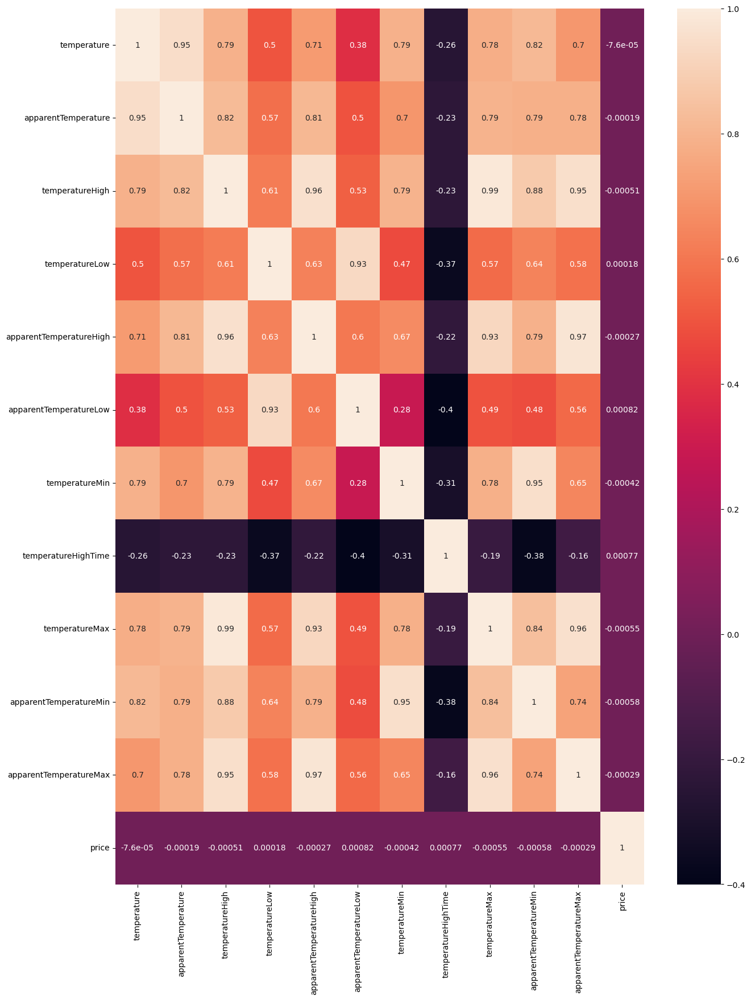

In [42]:
plt.figure(figsize=(15,20))
sns.heatmap(df_temp.corr(),annot=True)

### We see that all temperature related features have weak correlation with our target feature which is price

### Removing all of them will not make any impact to our regression model

In [43]:
new_df = new_df.drop(['temperature','apparentTemperature','temperatureHigh','temperatureLow','apparentTemperatureHigh',
                'apparentTemperatureLow','temperatureMin','temperatureHighTime','temperatureMax','apparentTemperatureMin','apparentTemperatureMax'],axis=1)
new_df.shape

(637975, 32)

### Second, i want to check the correlation of our cilmate related features with our target feature (Price)

In [44]:
climate_column = ['precipProbability', 'windSpeed',
       'windGust', 'visibility', 'dewPoint', 'pressure', 'windBearing',
       'cloudCover', 'uvIndex', 'ozone', 'moonPhase',
       'precipIntensityMax','price']
df_clim = new_df[climate_column]
df_clim.head()

,precipProbability,windSpeed,windGust,visibility,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,moonPhase,precipIntensityMax,price
0,0.0,8.66,9.17,10.000,32.70,1021.98,57,0.72,0,303.8,0.30,0.1276,5.0
1,1.0,11.98,11.98,4.786,41.83,1003.97,90,1.00,0,291.1,0.64,0.1300,11.0
2,0.0,7.33,7.33,10.000,31.10,992.28,240,0.03,0,315.7,0.68,0.1064,7.0
3,0.0,5.28,5.28,10.000,26.64,1013.73,310,0.00,0,291.1,0.75,0.0000,26.0
4,0.0,9.14,9.14,10.000,28.61,998.36,303,0.44,0,347.7,0.72,0.0001,9.0


<Axes: >

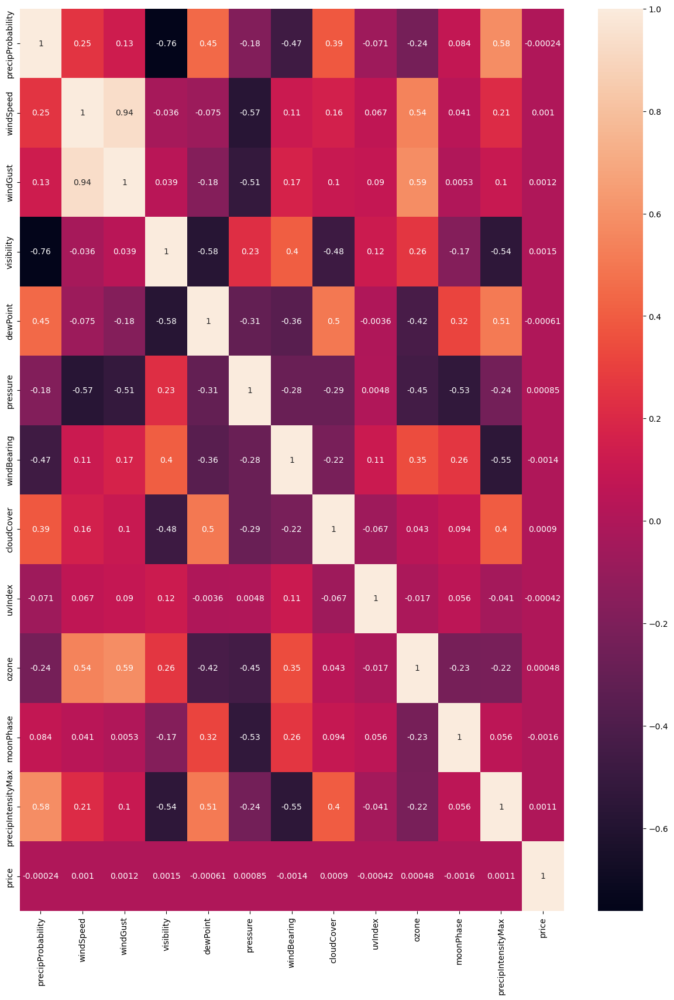

In [45]:
plt.figure(figsize=(15,20))
sns.heatmap(df_clim.corr(),annot=True)

<Axes: >

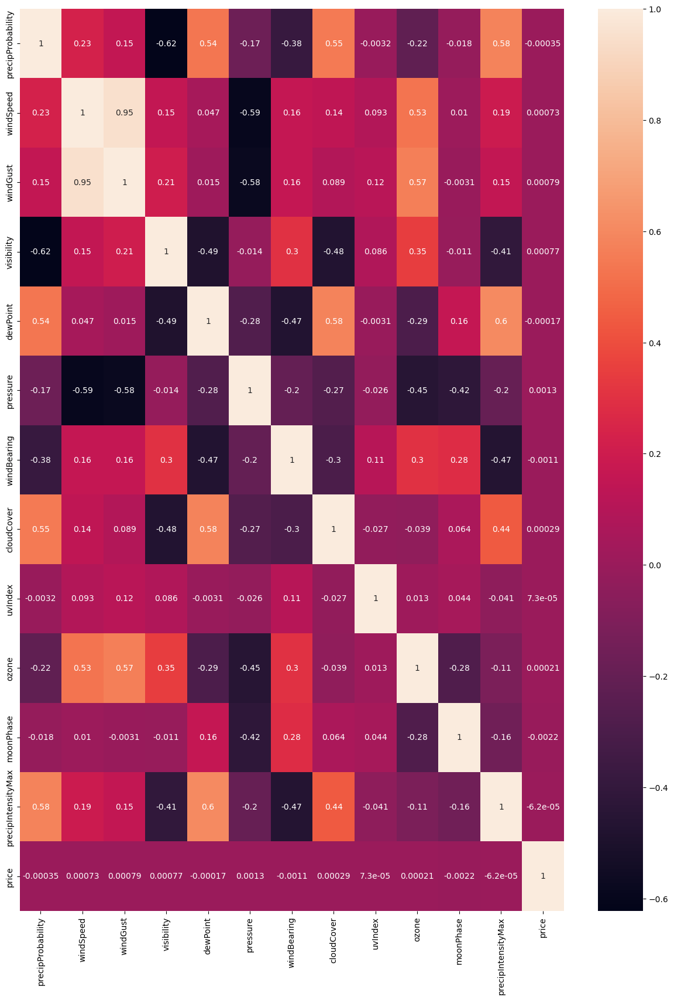

In [46]:
plt.figure(figsize=(15,20))
sns.heatmap(df_clim.corr(method='spearman'),annot=True)

### Apparently all climate related features also have weak correlation with our target feature which is price

### Once again, removing all of them will not make any impact to our regression model

In [47]:
new_df = new_df.drop(['precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'visibility', 'dewPoint', 'pressure', 'windBearing',
       'cloudCover', 'uvIndex', 'ozone', 'moonPhase',
       'precipIntensityMax'],axis=1)
new_df.shape

(637975, 18)

In [48]:
sample = new_df.copy()

### Third, i want to check our categorical value in our dataset features 

In [49]:
category_col = new_df.select_dtypes(include=['object','category']).columns.tolist()
for column in new_df[category_col]:
    print(f'{column} : {new_df[column].unique()}')
    print()

timezone : ['America/New_York']

source : ['Haymarket Square' 'Back Bay' 'North End' 'North Station' 'Beacon Hill'
 'Boston University' 'Fenway' 'South Station' 'Theatre District'
 'West End' 'Financial District' 'Northeastern University']

destination : ['North Station' 'Northeastern University' 'West End' 'Haymarket Square'
 'South Station' 'Fenway' 'Theatre District' 'Beacon Hill' 'Back Bay'
 'North End' 'Financial District' 'Boston University']

cab_type : ['Lyft' 'Uber']

product_id : ['lyft_line' 'lyft_premier' 'lyft' 'lyft_luxsuv' 'lyft_plus' 'lyft_lux'
 '6f72dfc5-27f1-42e8-84db-ccc7a75f6969'
 '6c84fd89-3f11-4782-9b50-97c468b19529'
 '55c66225-fbe7-4fd5-9072-eab1ece5e23e'
 '9a0e7b09-b92b-4c41-9779-2ad22b4d779d'
 '6d318bcc-22a3-4af6-bddd-b409bfce1546'
 '997acbb5-e102-41e1-b155-9df7de0a73f2']

name : ['Shared' 'Lux' 'Lyft' 'Lux Black XL' 'Lyft XL' 'Lux Black' 'UberXL'
 'Black' 'UberX' 'WAV' 'Black SUV' 'UberPool']

short_summary : [' Mostly Cloudy ' ' Rain ' ' Clear ' ' Partly Clou

### We can see that 'timezone' feature has only 1 value and 'product_id' feature contains many unidentified values. So we can remove or drop them.

In [50]:
new_df = new_df.drop(['timezone','product_id'],axis=1)

In [51]:
new_df.shape

(637975, 16)

### Fourth, we want to check the correlation of our categorical features with our target feature (price)

In [52]:
new_cat = ['source',
 'destination',
 'cab_type',
 'name',
 'short_summary',
 'icon','price']

df_cat = new_df[new_cat]
df_cat.head()

,source,destination,cab_type,name,short_summary,icon,price
0,Haymarket Square,North Station,Lyft,Shared,Mostly Cloudy,partly-cloudy-night,5.0
1,Haymarket Square,North Station,Lyft,Lux,Rain,rain,11.0
2,Haymarket Square,North Station,Lyft,Lyft,Clear,clear-night,7.0
3,Haymarket Square,North Station,Lyft,Lux Black XL,Clear,clear-night,26.0
4,Haymarket Square,North Station,Lyft,Lyft XL,Partly Cloudy,partly-cloudy-night,9.0


In [53]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

df_cat_encode= df_cat.copy()
for col in df_cat_encode.select_dtypes(include='O').columns:
    df_cat_encode[col]=le.fit_transform(df_cat_encode[col])

In [54]:
df_cat_encode

,source,destination,cab_type,name,short_summary,icon,price
0,5,7,0,7,4,5,5.0
1,5,7,0,2,8,6,11.0
2,5,7,0,5,0,1,7.0
3,5,7,0,4,0,1,26.0
4,5,7,0,6,6,5,9.0
...,...,...,...,...,...,...,...
693065,11,6,1,11,6,5,9.5
693066,11,6,1,10,6,5,13.0
693067,11,6,1,9,6,5,9.5
693069,11,6,1,1,6,5,27.0


### We will remove hour, day, month, latitude, longitude, because we won't need them for now

In [55]:
new_df = new_df.drop(['hour','day','month','latitude','longitude','short_summary'],axis=1)
new_df.head()

,timestamp,datetime,source,destination,cab_type,name,price,distance,surge_multiplier,icon
0,1.544953e+09,2018-12-16 09:30:07,Haymarket Square,North Station,Lyft,Shared,5.0,0.44,1.0,partly-cloudy-night
1,1.543284e+09,2018-11-27 02:00:23,Haymarket Square,North Station,Lyft,Lux,11.0,0.44,1.0,rain
2,1.543367e+09,2018-11-28 01:00:22,Haymarket Square,North Station,Lyft,Lyft,7.0,0.44,1.0,clear-night
3,1.543554e+09,2018-11-30 04:53:02,Haymarket Square,North Station,Lyft,Lux Black XL,26.0,0.44,1.0,clear-night
4,1.543463e+09,2018-11-29 03:49:20,Haymarket Square,North Station,Lyft,Lyft XL,9.0,0.44,1.0,partly-cloudy-night


In [56]:
new_df.columns

Index(['timestamp', 'datetime', 'source', 'destination', 'cab_type', 'name',
       'price', 'distance', 'surge_multiplier', 'icon'],
      dtype='object')

In [57]:
type(new_df)

pandas.core.frame.DataFrame

## 2. Removing Outliers

### We've already done this before but only to one instance which has maximum price value. We want to check another possible outlier.

### We're using IQR method for checking top and bottom outliers

In [58]:
Qp12 = new_df['price'].quantile(0.25)
Qp32 = new_df['price'].quantile(0.75)
IQRp = Qp32-Qp12

In [59]:
new_df[new_df['price']>(Qp32+(1.5*IQRp))]

,timestamp,datetime,source,destination,cab_type,name,price,distance,surge_multiplier,icon
706,1.543402e+09,2018-11-28 10:41:07,South Station,Back Bay,Lyft,Lux Black,52.5,3.25,2.00,partly-cloudy-night
707,1.544928e+09,2018-12-16 02:35:15,South Station,Back Bay,Lyft,Lux Black XL,67.5,3.25,2.00,partly-cloudy-night
769,1.544808e+09,2018-12-14 17:20:04,Theatre District,Boston University,Lyft,Lux Black XL,45.5,4.76,1.00,partly-cloudy-day
1094,1.543770e+09,2018-12-02 17:03:02,Theatre District,Fenway,Lyft,Lux Black XL,45.5,4.31,1.00,rain
1318,1.544977e+09,2018-12-16 16:10:07,Financial District,Boston University,Lyft,Lux Black XL,45.5,5.33,1.00,cloudy
...,...,...,...,...,...,...,...,...,...,...
692439,1.545078e+09,2018-12-17 20:20:04,Financial District,Boston University,Uber,Black SUV,47.0,5.56,1.00,partly-cloudy-day
692698,1.544782e+09,2018-12-14 10:00:11,Financial District,Fenway,Lyft,Lux Black XL,52.5,4.58,1.25,partly-cloudy-night
692891,1.543816e+09,2018-12-03 05:48:05,Financial District,Boston University,Lyft,Lux Black XL,47.5,5.42,1.00,fog
692962,1.543727e+09,2018-12-02 04:58:05,Back Bay,North End,Uber,Black SUV,51.0,7.36,1.00,partly-cloudy-night


In [60]:
new_df[new_df['price']<(Qp12-(1.5*IQRp))]

,timestamp,datetime,source,destination,cab_type,name,price,distance,surge_multiplier,icon


### We can see that we have 5588 data outliers. We can remove or drop them.

In [61]:
print('Size before removing :',new_df.shape)
new_df= new_df[~((new_df['price']>(Qp32+(1.5*IQRp))))]
print('Size after removing :',new_df.shape)

Size before removing : (637975, 10)
Size after removing : (632387, 10)


In [62]:
type(new_df)

pandas.core.frame.DataFrame

# 4. Regression Model

## 1. Dataset Split

In [63]:
df['datetime'] = df['datetime'].astype(str)
df.dtypes

id                              object
timestamp                      float64
hour                             int64
day                              int64
month                            int64
datetime                        object
timezone                        object
source                          object
destination                     object
cab_type                        object
product_id                      object
name                            object
price                          float64
distance                       float64
surge_multiplier               float64
latitude                       float64
longitude                      float64
temperature                    float64
apparentTemperature            float64
short_summary                   object
long_summary                    object
precipIntensity                float64
precipProbability              float64
humidity                       float64
windSpeed                      float64
windGust                 

In [64]:
from sklearn.model_selection import train_test_split
dum_new = pd.get_dummies(new_df)
X = dum_new.drop(columns=['price','timestamp','datetime','surge_multiplier'],axis=1)
y = dum_new['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

## 3. Modeling

## 3.1. Base Model

In [65]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression()

In [66]:
# Fit to data training
model = reg.fit(X_train,y_train)
y_pred=model.predict(X_test)

In [67]:
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.9185898806295798

In [68]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test,y_pred)
rmse = np.sqrt(mse)
print(mse)
print(rmse)

6.2800846048442525
2.50600969767562


### Then for the long journey we have done, we got our regression model with accuracy or score 93.37% and RMSE value 2.26. It's not the best score though, we still can improve it with other regression models which could give better results.

## 3.2. Finding Best Models with best configuration with GridSearch CV

In [69]:
!pip install xgboost
!pip install lightgbm

In [70]:
X.reset_index()

,index,distance,source_Back Bay,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,source_North Station,source_Northeastern University,source_South Station,source_Theatre District,source_West End,destination_Back Bay,destination_Beacon Hill,destination_Boston University,destination_Fenway,destination_Financial District,destination_Haymarket Square,destination_North End,destination_North Station,destination_Northeastern University,destination_South Station,destination_Theatre District,destination_West End,cab_type_Lyft,cab_type_Uber,name_Black,name_Black SUV,name_Lux,name_Lux Black,name_Lux Black XL,name_Lyft,name_Lyft XL,name_Shared,name_UberPool,name_UberX,name_UberXL,name_WAV,icon_ clear-day,icon_ clear-night,icon_ cloudy,icon_ fog,icon_ partly-cloudy-day,icon_ partly-cloudy-night,icon_ rain
0,0,0.44,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
1,1,0.44,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,2,0.44,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
3,3,0.44,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,4,0.44,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
632382,693065,1.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
632383,693066,1.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
632384,693067,1.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
632385,693069,1.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [71]:
from sklearn.model_selection import GridSearchCV,ShuffleSplit
from xgboost import XGBRFRegressor
from lightgbm import LGBMRegressor

def find_best_model_using_gridsearchcv(X,y):
    algos = {
        'lightgbm' : {
            'model': LGBMRegressor(),
            'params': {
                'max_depth': np.array([None, 3, 4, 5]),
                'n_estimators' : np.array([1,5,50,100]),
                'n_jobs' : np.array([-1])
            }
        },
        'xgboost' : {
            'model': XGBRFRegressor(),
            'params' : {
                'random_state' : np.array([2023])
            }
        }
    }
    scores = []
    cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=0)
    for algo_name, config in algos.items():
        gs =  GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
        gs.fit(X,y)
        scores.append({
            'model': algo_name,
            'best_score': gs.best_score_,
            'best_params': gs.best_params_
        })

    return pd.DataFrame(scores,columns=['model','best_score','best_params'])

import warnings
warnings.filterwarnings('ignore')

find_best_model_using_gridsearchcv(X,y)

,model,best_score,best_params
0,lightgbm,0.948425,"{'max_depth': None, 'n_estimators': 100, 'n_jo..."
1,xgboost,0.863924,{'random_state': 2023}


# Applying Model

In [72]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import KFold, GridSearchCV
import pickle

lgbm = LGBMRegressor(random_state=2023)
params = {'learning_rate': [0.1, 0.15, 0.3, 0.35, 0.4, 0.5],
          'n_estimators': [25, 50, 75],
          'max_depth':[2, 3, 4, 5]}
kfold = KFold(n_splits=5, shuffle=True, random_state=2023)
gcv = GridSearchCV(lgbm, param_grid=params,
                   cv=kfold, scoring='r2',n_jobs=-1)
gcv.fit(X, y)
print(gcv.best_params_)
print(gcv.best_score_)

{'learning_rate': 0.5, 'max_depth': 5, 'n_estimators': 75}
0.9493741053002719


In [73]:
X_test.columns

Index(['distance', 'source_Back Bay', 'source_Beacon Hill',
       'source_Boston University', 'source_Fenway',
       'source_Financial District', 'source_Haymarket Square',
       'source_North End', 'source_North Station',
       'source_Northeastern University', 'source_South Station',
       'source_Theatre District', 'source_West End', 'destination_Back Bay',
       'destination_Beacon Hill', 'destination_Boston University',
       'destination_Fenway', 'destination_Financial District',
       'destination_Haymarket Square', 'destination_North End',
       'destination_North Station', 'destination_Northeastern University',
       'destination_South Station', 'destination_Theatre District',
       'destination_West End', 'cab_type_Lyft', 'cab_type_Uber', 'name_Black',
       'name_Black SUV', 'name_Lux', 'name_Lux Black', 'name_Lux Black XL',
       'name_Lyft', 'name_Lyft XL', 'name_Shared', 'name_UberPool',
       'name_UberX', 'name_UberXL', 'name_WAV', 'icon_ clear-day ',
    

In [74]:
from lightgbm import LGBMRegressor
import pickle
lgbm = LGBMRegressor(random_state=2023, learning_rate=0.5, n_estimators=75, max_depth=5)
lgbm.fit(X, y)
y_pred = lgbm.predict(X_test)
filename = "regressor"
pickle.dump(lgbm, open(filename,'wb'))

### Here we got our best model is Light GBM regressor with r-squared 0.964, higher than our linear regression before.

#out put 

In [75]:
temp = new_df_onehot.drop('price',axis=1)

NameError: name 'new_df_onehot' is not defined

In [ ]:
X_test.shape

In [ ]:
def undummify(df, prefix_sep="_"):
    cols2collapse = {
        item.split(prefix_sep)[0]: (prefix_sep in item) for item in df.columns
    }
    series_list = []
    for col, needs_to_collapse in cols2collapse.items():
        if needs_to_collapse:
            undummified = (
                df.filter(like=col)
                .idxmax(axis=1)
                .apply(lambda x: x.split(prefix_sep, maxsplit=1)[1])
                .rename(col)
            )
            series_list.append(undummified)
        else:
            series_list.append(df[col])
    undummified_df = pd.concat(series_list, axis=1)
    return undummified_df

sample2 = undummify(X_test)

In [ ]:
sample2['price'] = y_pred

sample2.to_csv("final5.csv", index=False)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

In [ ]:
X_test.shape